End-to-end Dog breed classification

In [ ]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

Getting the workspace ready

In [ ]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow version: ", tf.__version__)
print("TensorFlow version: ", hub.__version__)

# check for GPU availability
print("GPU", "Working" if tf.config.list_physical_devices("GPU") else "not working")

TensorFlow version:  2.5.0
TensorFlow version:  0.12.0
GPU Working


## Getting our data ready
Convert all data to numbers (tensors : numpy arrays)

In [ ]:
# Check the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     e2dd7700aa63c7982130ec9087086bbb  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


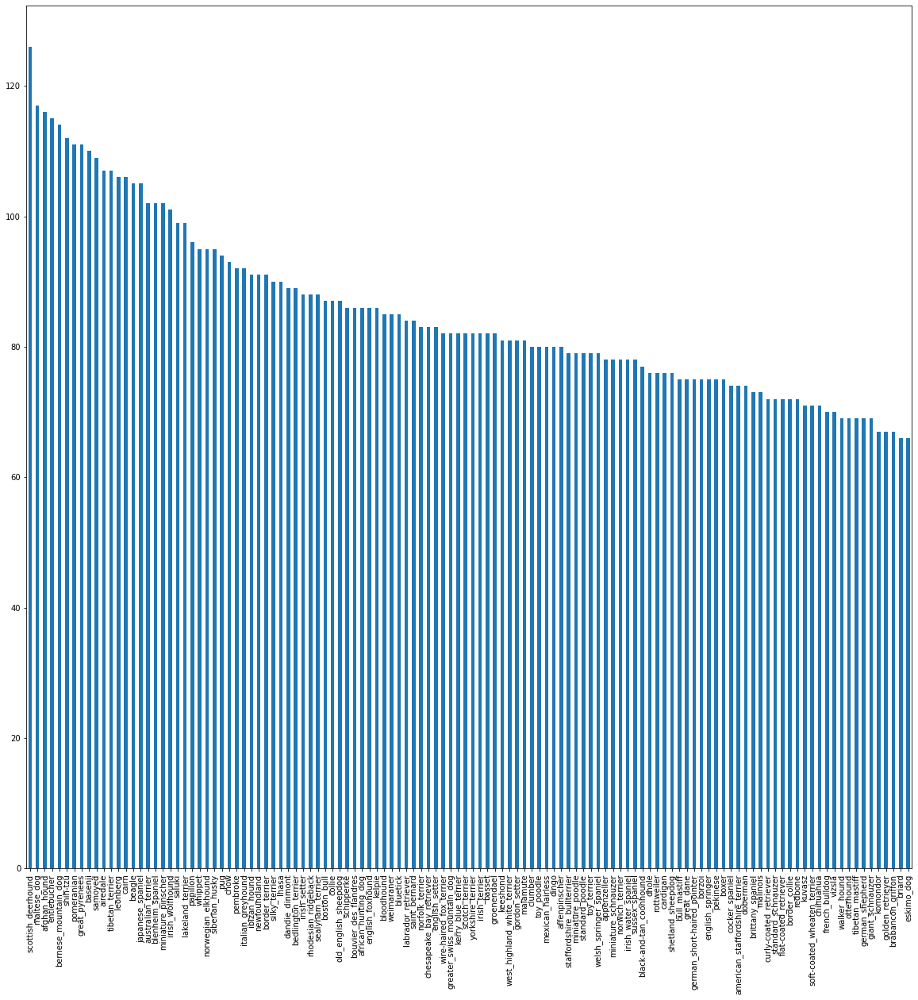

In [ ]:
# How many images of each breed are there
labels_csv['breed'].value_counts().plot.bar(figsize=(20,20));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

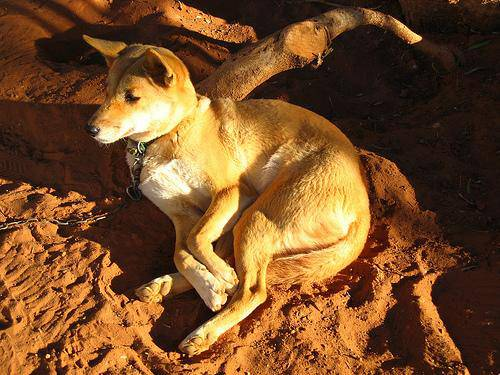

In [ ]:
# View an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Let's view all images by their id
Let's get a list of their pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image id's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check if the no. of labels match the total files in train set
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Matches")
else:
  print("Does not match")

Matches


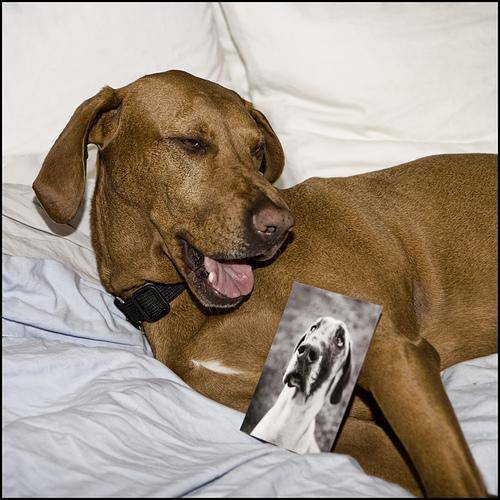

In [ ]:
Image(filenames[100])

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# see if no. of labels == no. of filenames
if len(labels) == len(filenames):
  print("matches")
else:
  print("Does not match")

matches


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
# turn every label into boolean arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning our boolean_labels into integers


In [ ]:
boolean_labels[0].argmax()

19

In [ ]:
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

## Creating our validation set


In [ ]:
X = filenames
y = boolean_labels

We will experiment on ~1000 images

In [ ]:
# Set no. of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:1000}

In [ ]:
# Split data into train and validate
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

# Turning images into Tensors
We are gonna write a function to do so

In [ ]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[40])
image.shape

(293, 400, 3)

In [ ]:
image[:2]

array([[[255, 246, 252],
        [254, 237, 243],
        [253, 237, 240],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 251, 249],
        [255, 246, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 141,  72]]], dtype=uint8)

In [ ]:
# turn our image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 400, 3), dtype=uint8, numpy=
array([[[255, 246, 252],
        [254, 237, 243],
        [253, 237, 240],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 251, 249],
        [255, 246, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 141,  72]]], dtype=uint8)>

# Function to preprocess the data

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image_path as input and turns it into a tensor
  '''

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensors with 3 colour channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert colour channels value from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image


# Turn our data into batches
The model cannot train all 10k+ images at a time, since it would require a alarge memory.
Instead we break them into batches (ideal 32 / batch)

In [ ]:
# A function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path and associated label, processes it and returns
  a tuple of form (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# demo
(process_image(X[20]), tf.constant(y[20]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.4686362 , 0.48284388, 0.4388923 ],
         [0.43491846, 0.46069017, 0.4125102 ],
         [0.45447832, 0.4979307 , 0.44302875],
         ...,
         [0.43456125, 0.5049195 , 0.28860298],
         [0.39823228, 0.4980573 , 0.26960978],
         [0.37409884, 0.48390275, 0.24988663]],
 
        [[0.43431306, 0.46279556, 0.4211807 ],
         [0.43068317, 0.4688092 , 0.42564145],
         [0.45039746, 0.49808303, 0.45071962],
         ...,
         [0.43917897, 0.51070905, 0.3056251 ],
         [0.3906706 , 0.4944172 , 0.2534024 ],
         [0.34645557, 0.4601811 , 0.20911317]],
 
        [[0.41501755, 0.4622952 , 0.4238247 ],
         [0.40084037, 0.4505865 , 0.40968493],
         [0.44426945, 0.4941148 , 0.45284492],
         ...,
         [0.4272146 , 0.50133634, 0.31526017],
         [0.38620418, 0.48767138, 0.25313336],
         [0.33333334, 0.44705886, 0.19360997]],
 
        ...,
 
        [[0.8738844 , 0.8699628 

# Make a function to turn all the X and y data into batches

In [ ]:
# Create a batch_size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches outta the tensor tuple (image, label).
  Shuffles data if it is training and does not if it is validation
  Accepts test data also. (no labels)
  '''

  # if data is test data, then prolly does not have labels
  if test_data:
    print('Createing test data batches....')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, no need to shuffle it
  elif valid_data:
    print("Creating valid data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
      print("Creating train data batches.....")
      # turn filepaths and labels to tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y)))
      # shuffling pathnames and labels
      data = data.shuffle(buffer_size=len(X))

      # create (image, label) tuples
      data = data.map(get_image_label)

      # turn train data into batches
      data_batch = data.batch(BATCH_SIZE)

  return data_batch




In [ ]:
# create train and valid data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating train data batches.....
Creating valid data batches.....


In [ ]:
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Visualising data batches

In [ ]:
import matplotlib.pyplot as plt

# create a function to view images in a data batch
def show_25_images(images, labels):

  '''
  Displays a plot of 25 images and their labels from a data batch
  '''
  # setup the figure
  plt.figure(figsize=(10,10))
  # loop through the 25 images
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # display an image
    plt.imshow(images[i])
    # add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")




In [ ]:
len(train_data)

25

In [ ]:
len(X)

10222

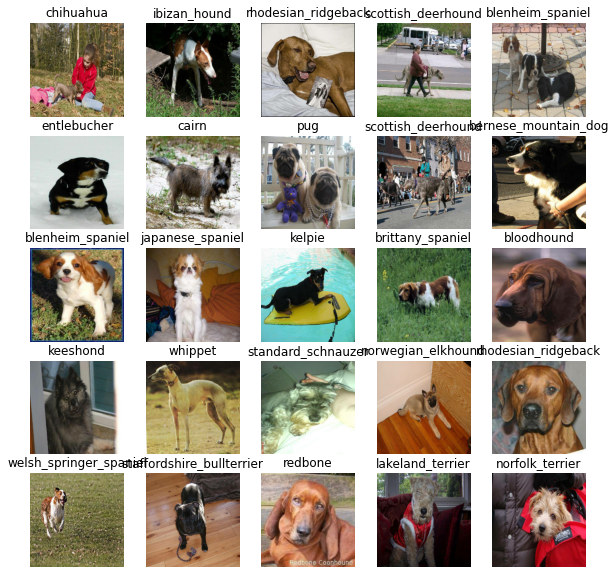

In [ ]:
# Visualise data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [ ]:
type(train_images)

numpy.ndarray

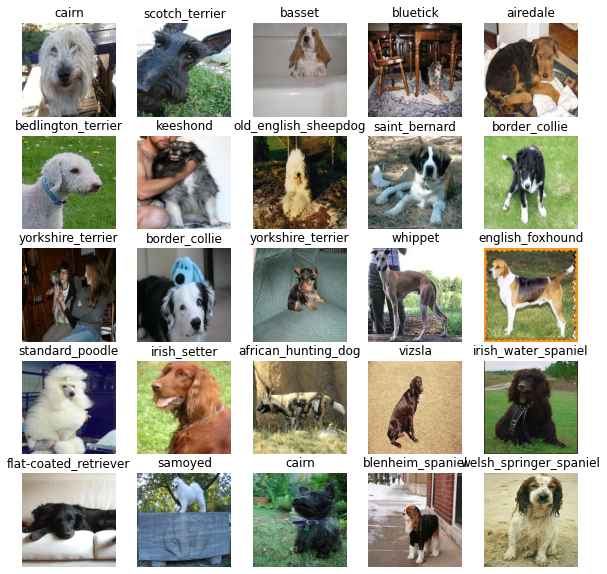

In [ ]:
val_images, val_label = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_label)

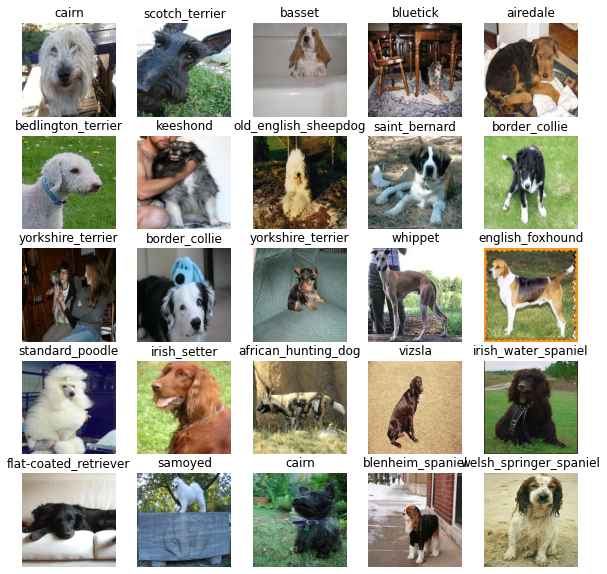

In [ ]:
val_images, val_label = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_label)

## Building a model

In [ ]:
# setup input shape to model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# setup output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Using a keras deep learning model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # setup
  model = tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                activation="softmax") # Layer 2 (output layer)
  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)

  return model



In [ ]:
model = create_model()
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating Callbacks
We will create 2 callbacks:
1. TensorBoard to track our models progress
2. Stop the training if model trains for too long (overfitting)

In [ ]:
# Load TenserBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a tensorflow callback
def create_tensorboard_callback():
  # Create a log directory to store tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Logs are tracked when we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

In [ ]:
# creating early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on subset of data)
Check if everything is working on the 1000 images

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [ ]:
# checking  if we still running on GPU
print("GPU", "Working" if tf.config.list_physical_devices("GPU") else "Not working")

GPU Working


Let's make a function to train a model and return it


In [ ]:
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create a model
  model = create_model()

  # Create a TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to data passing it callbacks we made
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 124s 4s/step - loss: 4.6658 - accuracy: 0.0787 - val_loss: 3.4960 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 134ms/step - loss: 1.6696 - accuracy: 0.6850 - val_loss: 2.2401 - val_accuracy: 0.4050
Epoch 3/100
25/25 [==============================] - 4s 158ms/step - loss: 0.5678 - accuracy: 0.9438 - val_loss: 1.6814 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 4s 160ms/step - loss: 0.2560 - accuracy: 0.9887 - val_loss: 1.5048 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 4s 157ms/step - loss: 0.1486 - accuracy: 0.9975 - val_loss: 1.4092 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 4s 157ms/step - loss: 0.1014 - accuracy: 1.0000 - val_loss: 1.3767 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================]

In [ ]:
# Check the results in the logdir using TensorBoard magic function
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make prediction on validation data
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 99ms/step


array([[3.36040300e-03, 6.69373476e-05, 1.21723546e-03, ...,
        8.27428739e-05, 6.91646301e-06, 7.75702717e-03],
       [1.72590243e-03, 1.16566208e-03, 1.85344554e-02, ...,
        9.04240063e-04, 2.47077132e-03, 6.95712806e-04],
       [4.20719516e-05, 7.49182218e-05, 5.00511924e-05, ...,
        1.67733488e-05, 4.79880342e-04, 7.91864077e-05],
       ...,
       [8.45078375e-06, 7.19151149e-06, 1.68231883e-04, ...,
        4.00791796e-05, 9.49771711e-05, 4.07651669e-06],
       [1.79672323e-03, 1.07068045e-04, 1.98672584e-04, ...,
        7.24241690e-05, 3.07980918e-05, 1.04594752e-02],
       [3.63135448e-04, 3.49608308e-05, 3.40887782e-04, ...,
        2.24000514e-02, 2.25107869e-04, 3.72335548e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([3.36040300e-03, 6.69373476e-05, 1.21723546e-03, 8.37489642e-05,
       3.95481999e-04, 2.96204998e-05, 3.71548161e-02, 1.06077979e-03,
       7.55696674e-04, 1.39398107e-04, 9.95421782e-04, 1.29425593e-04,
       4.96599299e-04, 2.77376294e-05, 5.85515460e-04, 1.66402460e-04,
       4.36104965e-05, 2.88738936e-01, 1.95332505e-05, 7.04349486e-06,
       3.85231688e-03, 2.25401178e-04, 7.68735936e-06, 9.36743920e-04,
       2.75537350e-05, 1.92647174e-04, 1.82514206e-01, 4.44846773e-05,
       8.72710079e-04, 1.73611857e-04, 3.96626965e-05, 6.05510024e-04,
       1.44857273e-04, 3.05028266e-06, 9.29325179e-05, 4.51963283e-02,
       7.50937252e-05, 4.88013146e-04, 8.28958582e-05, 3.75585842e-05,
       5.36707975e-03, 3.03887628e-05, 1.69993320e-04, 3.22925247e-04,
       3.34473734e-05, 1.00725592e-04, 6.10397547e-05, 6.41788938e-05,
       6.83894265e-04, 1.67527411e-04, 8.39530549e-04, 3.39528196e-05,
       1.13315269e-04, 9.31407976e-06, 6.81825550e-05, 1.21415898e-04,
      

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
OUTPUT_SHAPE

120

In [ ]:
np.sum(predictions[0]), np.sum(predictions[1])

(1.0, 1.0)

In [ ]:
# Make some predictions
index = 119
print(predictions[index])
print("Max value (prob. of prediction): ", np.max(predictions[index]))
print("Sum: ", np.sum(predictions[index]))
print("Max index: ", np.argmax(predictions[index]))
print("Predicted label: ", unique_breeds[np.argmax(predictions[index])])

[6.64030304e-05 2.37057757e-04 2.43832168e-04 1.12590182e-03
 8.65159929e-03 8.30426725e-05 1.16194761e-03 4.09320419e-05
 1.30342174e-04 5.05659300e-05 2.30551278e-03 9.25510758e-05
 2.69772019e-04 2.71827830e-05 2.95251986e-04 4.63288365e-04
 3.86933418e-04 1.24336249e-04 2.27800943e-03 2.68006352e-05
 2.80251261e-04 2.61364295e-03 4.55599475e-05 1.20340229e-03
 1.64175042e-04 2.61498196e-03 2.17607594e-04 5.90770651e-06
 7.46438454e-04 1.13919581e-04 2.33943974e-05 2.04238971e-03
 1.86158304e-05 9.00974032e-04 1.55554822e-04 1.11789937e-04
 3.88341869e-05 2.42207490e-04 2.73554400e-02 2.05864036e-03
 3.10431537e-03 3.35672812e-04 5.69429585e-06 3.28376082e-05
 4.62019641e-04 4.52474516e-04 4.89412378e-05 5.75548457e-03
 3.14310571e-04 3.62538231e-05 1.89660379e-04 7.34584697e-04
 1.35066424e-04 3.17647733e-04 8.36891122e-05 5.63345384e-03
 2.36404070e-04 9.82719590e-04 1.12605549e-03 1.25058368e-02
 4.80102003e-01 1.94503882e-04 8.53016536e-05 1.34076297e-04
 5.21645707e-04 8.996980

In [ ]:
unique_breeds[114]

'weimaraner'

# Prediction probabilities also known as confidence levels
Seeing predicted images is better than nd arrays

In [ ]:
# turn prediction probs into their labels
def get_pred_label(prediction_probs):
  '''
  Turns an array of prediction probs into a label
  '''
  return unique_breeds[np.argmax(prediction_probs)]

  # get a predicted label based in an array of prediction probs
pred_label = get_pred_label(predictions[1])
pred_label

'miniature_schnauzer'

In [ ]:
# Function to unbatch a batch dataset
def unbatchify(dataset):
  '''
  Takes a batch dataset of (image, label) and returns seperate arrays of images and labels
  '''
  images = []
  labels = []
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]



(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(valid_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get get:

Prediction labels
Validation labels (truth labels)
Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_prob, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_probs, true_label, image = prediction_prob[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_probs)

  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title depending on the right or wrong prediction
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to predicted label, probability of prediction and truth label
  plt.title("{} {:.2f}% {}".format(pred_label,
                              np.max(pred_probs)*100,
                              true_label),
                              color=color)



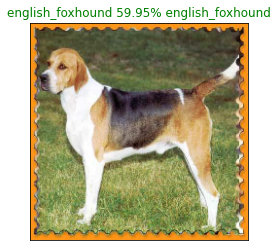

In [ ]:
plot_pred(prediction_prob=predictions,
          labels=valid_labels,
          images=valid_images,
          n=14)

In [ ]:
1+1

2

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probs, labels, n=1):
  '''
  PLot top 10 highest prediction probs against truth labels for sample n
  '''
  pred_prob, true_label = prediction_probs[n], labels[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

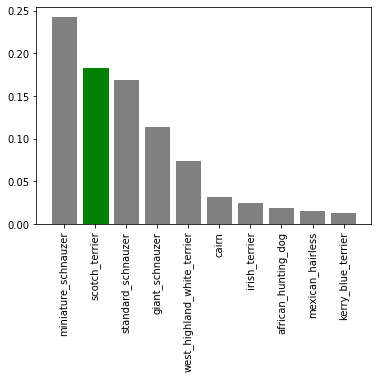

In [ ]:
plot_pred_conf(prediction_probs=predictions,
               labels=valid_labels,
               n=1)

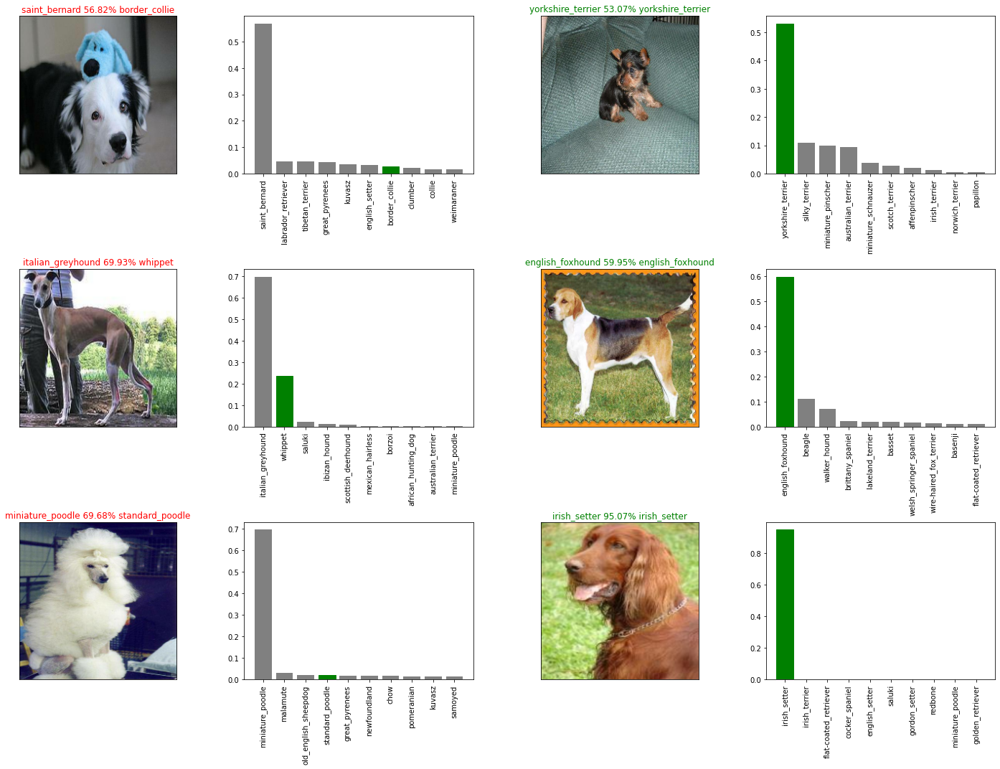

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 11
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,
            labels=valid_labels,
            images=valid_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
                 labels=valid_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


# Save and load the model

In [ ]:
# Create the function
def save_model(model, suffix=None):
  '''
  Saves a model in models folder and appends a suffix(string)
  '''
  # create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # model extension = h5
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path



In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, "1000-images-mobilev2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210618-10571624013866-1000-images-mobilev2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210618-10571624013866-1000-images-mobilev2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20210607-12361623069416-1000-images-mobilev2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210607-12361623069416-1000-images-mobilev2-Adam.h5


In [ ]:
loaded_1000_image_model

In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 92ms/step - loss: 1.3048 - accuracy: 0.6150


[1.304785966873169, 0.6150000095367432]

In [ ]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 87ms/step - loss: 1.2677 - accuracy: 0.6750


[1.2676646709442139, 0.675000011920929]

## Training a big dog model (on the full data)

In [ ]:
len(X)

10222

In [ ]:
# Create a data batch on full data set
full_data = create_data_batches(X, y)

Creating train data batches.....


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create full model on full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)

## This may take some time since you are working with the whole data

In [ ]:
# fit the full model to data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1008s 3s/step - loss: 1.3449 - accuracy: 0.6682
Epoch 2/100
320/320 [==============================] - 34s 104ms/step - loss: 0.3982 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2354 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1545 - accuracy: 0.9609
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1054 - accuracy: 0.9803
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0777 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0580 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0475 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0401 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 34s 105ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210618-11481624016927-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210618-11481624016927-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# loading full model
full_loaded_model = load_model("drive/MyDrive/Dog Vision/models/20210618-11481624016927-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210618-11481624016927-full-image-set-mobilenetv2-Adam.h5


## Making predictions on test data

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.


In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e21d378710d164f126e7d0b380dc7a1a.jpg',
 'drive/MyDrive/Dog Vision/test/e22127411f6347464f3e91a775bd0245.jpg',
 'drive/MyDrive/Dog Vision/test/e46db7bcb804584eed8821ad4e132fd1.jpg',
 'drive/MyDrive/Dog Vision/test/e2628b6bde028b5eb593616128728907.jpg',
 'drive/MyDrive/Dog Vision/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg',
 'drive/MyDrive/Dog Vision/test/e647098485898391b700270c61824282.jpg',
 'drive/MyDrive/Dog Vision/test/e4c37f2fbeabc98e168ebf4abce59370.jpg',
 'drive/MyDrive/Dog Vision/test/e12168553b1e0b5e56d5ab6ac8a58984.jpg',
 'drive/MyDrive/Dog Vision/test/e004d9f3a6236e2de6dd0f386b685059.jpg',
 'drive/MyDrive/Dog Vision/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg']

In [ ]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Createing test data batches....


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

This will also take some time to predict since we ave so many images

In [ ]:
# Make predictions on test data batch using the full model
test_predictions = full_loaded_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1100s 3s/step


In [ ]:
# save predictions to a csv file
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.58657065e-10, 2.62381200e-10, 1.33635160e-11, ...,
        5.91910609e-09, 1.95224359e-07, 6.66635245e-08],
       [2.62100841e-10, 7.63853677e-06, 9.52460125e-11, ...,
        8.07998024e-09, 9.44722300e-10, 8.35021108e-10],
       [2.10982377e-11, 3.68695879e-10, 4.78070500e-11, ...,
        4.12911760e-07, 1.52602497e-05, 6.89474103e-11],
       ...,
       [1.57735836e-09, 2.51099419e-10, 6.81073462e-11, ...,
        3.11478135e-11, 1.10083138e-05, 1.53421126e-06],
       [8.10422705e-07, 1.19554329e-07, 9.38681771e-12, ...,
        3.02953576e-05, 3.40427769e-10, 6.89680277e-08],
       [1.06618195e-11, 3.02490122e-09, 1.27442140e-10, ...,
        4.18443997e-05, 5.45942758e-09, 2.61682624e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset prediction for Kaggle
To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to preds dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e21d378710d164f126e7d0b380dc7a1a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e22127411f6347464f3e91a775bd0245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e46db7bcb804584eed8821ad4e132fd1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2628b6bde028b5eb593616128728907,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e6af47e8b6973c8f8d2b9fd5af94c54d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Append the probs of all breeds to preds_df
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e21d378710d164f126e7d0b380dc7a1a,5.58657e-10,2.62381e-10,1.33635e-11,1.22438e-08,3.74604e-10,1.98859e-10,1.24098e-08,4.76943e-12,5.50682e-11,1.663e-09,8.13616e-12,1.69492e-12,3.9025e-13,7.30376e-12,3.17146e-08,5.75788e-11,1.32859e-13,0.999927,2.12277e-12,1.42608e-11,4.10283e-10,1.80491e-07,5.79893e-05,4.82656e-12,1.63065e-13,2.74279e-10,2.02933e-09,8.57439e-11,9.72626e-11,4.55474e-10,5.42912e-12,9.73746e-13,5.90307e-09,5.99511e-13,3.01262e-12,1.19035e-07,1.26486e-10,3.18382e-10,9.4275e-12,...,3.0369e-12,1.36201e-06,2.00672e-14,7.95047e-13,9.8319e-11,3.40028e-09,2.94009e-11,2.91123e-13,4.20197e-10,5.43254e-10,1.42397e-10,3.6892e-12,1.08475e-11,1.64609e-13,6.93705e-13,6.15045e-09,8.15059e-09,5.866e-12,4.99278e-07,3.05614e-13,3.11908e-09,1.9555e-14,5.91677e-11,4.72606e-06,8.32869e-09,8.15778e-11,2.08822e-07,3.8459e-10,6.03809e-13,8.3067e-13,1.066e-06,5.23564e-08,1.06478e-12,3.71212e-12,9.87004e-16,9.70322e-12,6.94949e-12,5.91911e-09,1.95224e-07,6.66635e-08
1,e22127411f6347464f3e91a775bd0245,2.62101e-10,7.63854e-06,9.5246e-11,1.07995e-09,1.30539e-08,5.35292e-09,9.13591e-09,3.64838e-09,4.51635e-11,1.53688e-10,5.30125e-12,3.33127e-10,6.28344e-10,5.61942e-10,1.39308e-10,1.76486e-09,5.66111e-09,2.89872e-12,3.63377e-05,3.4824e-10,7.92815e-12,5.34496e-10,7.26068e-12,4.98721e-07,3.06079e-10,4.62264e-09,2.27129e-11,7.98577e-08,4.16997e-11,4.15906e-09,7.63362e-06,2.35154e-09,1.6519e-07,0.985586,2.36512e-11,2.71442e-10,7.32155e-11,2.15383e-09,5.67565e-08,...,2.91345e-11,8.99517e-09,5.02675e-09,1.08885e-09,1.2912e-08,2.42483e-06,1.93831e-09,2.73515e-05,6.97528e-10,1.56461e-09,1.88719e-09,1.77979e-08,1.37051e-08,7.35135e-09,1.07756e-08,4.63617e-09,4.33891e-10,1.07803e-08,6.65258e-12,0.0143287,5.01815e-11,8.00464e-11,4.06661e-09,5.00891e-12,6.85346e-10,2.32978e-08,1.76023e-11,2.8953e-09,2.39474e-07,5.8843e-08,2.30756e-09,8.34199e-11,1.20571e-09,1.3941e-08,2.20462e-10,2.74626e-08,3.29033e-12,8.07998e-09,9.44722e-10,8.35021e-10
2,e46db7bcb804584eed8821ad4e132fd1,2.10982e-11,3.68696e-10,4.7807e-11,8.09593e-08,1.05208e-07,1.06742e-08,1.48017e-05,8.42691e-05,0.00152484,0.00376458,1.43519e-09,7.80134e-11,3.55577e-05,2.12345e-08,0.000639458,1.23608e-06,1.06321e-07,3.18462e-06,2.29492e-09,6.89596e-09,6.48695e-11,7.72387e-07,2.57931e-08,3.11076e-12,9.98233e-09,9.71737e-09,6.2581e-11,3.88709e-09,9.63583e-08,1.50561e-08,4.22698e-10,1.07016e-10,1.18006e-11,1.06241e-08,6.86761e-09,2.4461e-09,1.54101e-07,9.97184e-07,2.76486e-09,...,2.62443e-09,3.91763e-10,9.65637e-07,1.41278e-05,1.41691e-10,6.06884e-11,1.47987e-07,3.57089e-13,2.07567e-11,3.85329e-06,1.02992e-07,5.75782e-09,2.72249e-09,8.72029e-08,4.19474e-11,1.33939e-09,3.60464e-13,6.54061e-10,1.95655e-09,1.20693e-05,1.26081e-11,4.97933e-11,4.87164e-09,2.44078e-10,3.14647e-09,3.26468e-09,1.11707e-08,5.09409e-11,2.77456e-10,5.47907e-08,3.65855e-10,2.10785e-10,3.23008e-06,0.989603,6.28945e-09,1.72234e-08,1.09784e-10,4.1

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]